In [21]:
import numpy as np #matrices operations
from torchvision import transforms # Tensor operations to convert images in appropriate form
import matplotlib.pyplot as plt # Plotting tools
import random # Randomizing func
import matplotlib.patches as patches #special tools for drawing bboxes, polygones & other geomety side
from model import * # some for our model
from utils import * # some tools for parcing and drawing for out challenge
from utils_new_ import *
import os

import torch
import torchvision
from torchvision import ops
import torch.nn as nn  # ALL OF THIS KNOW
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torch.nn.utils.rnn import pad_sequence # tool for tensor review as a largest sequence

import warnings
warnings.filterwarnings('ignore')

import cv2

# xml library for parsing xml files
from xml.etree import ElementTree as ET
import matplotlib.patches as patches

# torchvision libraries
import torch
import torchvision
from torchvision import transforms 
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

#these are the helper libraries imported.
from engine import train_one_epoch, evaluate
import utils
import transforms as T

# for image augmentations
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

In [ ]:
pip install opencv-python==4.5.5.64

# Creating the dataset for our folder

In [22]:
img_width = 1024
img_height = 810
annotation_path = "data/annotations.xml"
image_dir = os.path.join("data", "images")
name2idx_cars = {'pad': 0, 'car': 1}
idx2name = {v:k for k, v in name2idx_cars.items()}

In [3]:
import glob

In [25]:
from PIL import Image

class ObjectDetectionDataset(Dataset):
    def __init__(self, image_paths, label_paths, transforms = None):
        self.width = img_width
        self.height = img_height
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transforms = transforms
        self.img_data_all,  self.targets_all = self.get_data()
        
    def __len__(self):
        return len(self.image_paths)     
        
        
    #     return image_tensor, boxes_tensor, labels_tensor
    def __getitem__(self, idx):
        return self.img_data_all[idx], self.targets_all[idx] #, self.gt_classes_all[idx]
    
    def get_data(self):
        
        img_data_all = []
        gt_idxs_all = []
        gt_bboxes_all = []
        area_all = []
        iscrowd_all = []
        targets_all = []
        
        
        for i, img_path in enumerate(self.image_paths):
             # skip if the image path is not valid
            labels = []
            boxes = []
            target = {}
            
            
                
            # read and resize image
            # image = Image.open(img_path)
            tree = ET.parse(self.label_paths[i])
            root = tree.getroot()
            
            
            # convert image to torch tensor and reshape it so channels come first
            image = Image.open(img_path).convert('L')
            image = np.array(image)
            # print(image.shape)
            # img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
            img_res = cv2.resize(image, (self.width, self.height)).astype(np.float32)
            img_res = cv2.GaussianBlur(img_res,(11, 11), 10)
            # diving by 255
            img_res /= 255.0
            transform =  transforms.ToTensor()
            
            
            # encode class names as integers
            for obj in root.findall('object'):
                label = name2idx_cars[obj.find('name').text]
                bbox = obj.find('bndbox')
                xmin = float(bbox.find('xmin').text)
                ymin = float(bbox.find('ymin').text)
                xmax = float(bbox.find('xmax').text)
                ymax = float(bbox.find('ymax').text)
                labels.append(label)
                boxes.append([xmin, ymin, xmax, ymax])
            
            boxes = torch.Tensor(boxes)    
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
            
            labels = torch.Tensor(labels).type_as(torch.LongTensor())
            iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
             
            
            img_data_all.append(transform(img_res))
            gt_idxs_all.append(labels)
            gt_bboxes_all.append(boxes)
            target["boxes"] = boxes
            target["labels"] = labels
            target["area"] = area
            target["iscrowd"] = iscrowd
            # image_id
            image_id = i
            target["image_id"] = image_id
            # targets_all.append(target)
            
            if self.transforms:
            
                sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)
            
                image = sample['image']
                target['boxes'] = torch.Tensor(sample['bboxes'])
            
            targets_all.append(target)
            
            
        for target in targets_all:
            gt_bboxes_all.append(target['boxes'])
            gt_idxs_all.append(target['labels'])
            area_all.append(target['area'])
            iscrowd_all.append(target['iscrowd'])
            
            
        # pad bounding boxes and classes so they are of the same size
        # gt_bboxes_pad = pad_sequence(gt_bboxes_all, batch_first=True, padding_value=-1)
        # gt_idxs_all = pad_sequence(gt_idxs_all, batch_first=True, padding_value=0)
        # area_pad = pad_sequence(area_all, batch_first=True, padding_value=0)
        # iscrowd_pad = pad_sequence(iscrowd_all, batch_first=True, padding_value=0)
        
        for i, target in enumerate(targets_all):
            target['boxes'] = gt_bboxes_all[i]
            target['labels'] = gt_idxs_all[i]
            target['area'] = area_all[i]
            target['iscrowd'] = iscrowd_all[i]
            
        # stack all images
        img_data_stacked = torch.stack(img_data_all, dim=0)
        
        
        return img_data_stacked.to(dtype=torch.float32),  targets_all

# Пример использования
# image_paths = ['image1.jpg', 'image2.jpg', 'image3.jpg']
# label_paths = ['label1.xml', 'label2.xml', 'label3.xml']

# dataset = ObjectDetectionDataset(image_paths, label_paths)

In [33]:
def get_transform(train):
    
    if train:
        return A.Compose([
                            A.HorizontalFlip(0.5),
                     # ToTensorV2 converts image to pytorch tensor without div by 255
                            ToTensorV2(p=1.0) 
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [5]:
image_path_train = "C:\\Users\\Пользователь\\Desktop\\Python_Development\\German_Cars_classification\\Object_detection\\train_c\\*.jpg" 
images_train = glob.glob(image_path_train)

labels_path_train =  "C:\\Users\\Пользователь\\Desktop\\Python_Development\\German_Cars_classification\\Object_detection\\train_c\\*.xml"
labels_train = glob.glob(labels_path_train)

In [6]:
len(images_train), len(labels_train)

(188, 188)

In [37]:
dataset_train = ObjectDetectionDataset(images_train, labels_train)

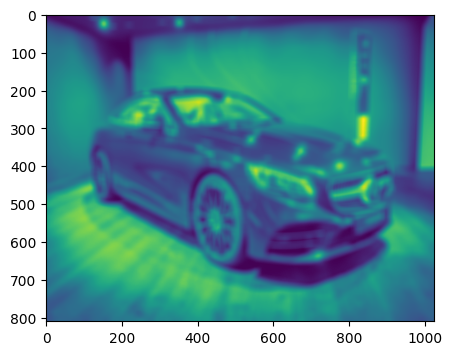

In [38]:
figure = plt.figure(figsize=(5, 5))
image = transforms.ToPILImage()(dataset_train.get_data()[0][0])
plt.imshow(image)
plt.show()

# So, the parcing was totally correct

In [39]:
image_path_test = "C:\\Users\\Пользователь\\Desktop\\Python_Development\\German_Cars_classification\\Object_detection\\test\\*.jpg"
images_test = glob.glob(image_path_test)
labels_path_test =  "C:\\Users\\Пользователь\\Desktop\\Python_Development\\German_Cars_classification\\Object_detection\\test\\*.xml"
labels_test = glob.glob(labels_path_test)

In [40]:
dataset_test = ObjectDetectionDataset(image_paths=images_test, label_paths=labels_test)

In [41]:
len(dataset_test)

48

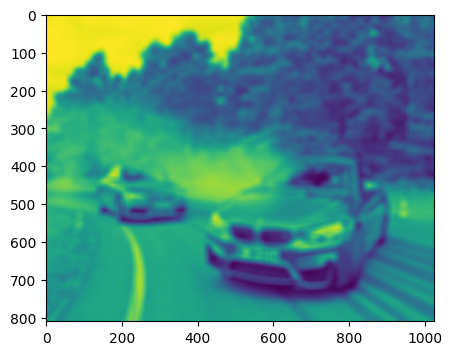

In [42]:
figure = plt.figure(figsize=(5, 5))
image = transforms.ToPILImage()(dataset_test.get_data()[0][1])
plt.imshow(image)
plt.show()

In [43]:
batch_size = 5

In [44]:
loaders = {'training': DataLoader(dataset_train, batch_size, shuffle=True, 
    collate_fn=utils.collate_fn),
           'test': DataLoader(dataset_test, batch_size, shuffle = False,
    collate_fn=utils.collate_fn)}

In [45]:
len(loaders['training'].dataset)

188

In [46]:
len(loaders['test'].dataset)

48

# Let's check the format of annotations & our dataset similarities

# Ok, we finally got two our datasets

# Grab one batch of training set (Warning:here's the preprocess of previous task, where I tried to classify car brands between Mercedes, Audi & BMW. But here represented the solution of cars recognition model. The code about selective search corresponds to another challenge. Don't try to execute cells untill the * sign)

In [ ]:
for img_batch, gt_bboxes_batch, gt_classes_batch in loaders['training']:
    img_data_all = img_batch
    gt_bboxes_all = gt_bboxes_batch
    gt_classes_all = gt_classes_batch
    break
    
img_data_all = img_data_all[:2]
gt_bboxes_all = gt_bboxes_all[:2]
gt_classes_all = gt_classes_all[:2]

In [16]:
img_data_all.size()

torch.Size([2, 3, 640, 640])

# Display Images and Bounding Boxes

In [17]:
gt_class_1 = gt_classes_all[0].long()
print(gt_class_1)
gt_class_1 = [idx2name[idx.item()] for idx in gt_class_1]
print(gt_class_1)

tensor([3, 0, 0, 0, 0, 0, 0])
['mercedes', 'pad', 'pad', 'pad', 'pad', 'pad', 'pad']


In [19]:
gt_class_2 = gt_classes_all[1].long()
gt_class_2 = [idx2name[idx.item()] for idx in gt_class_2]

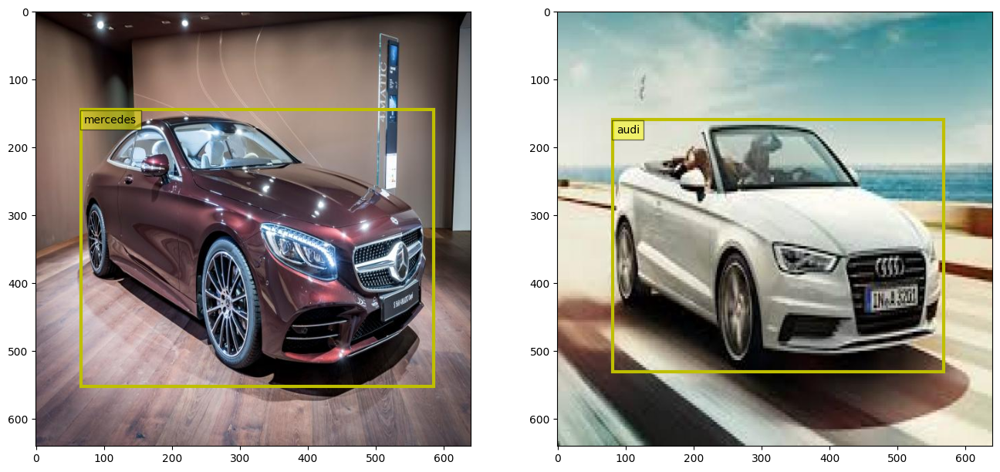

In [20]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)
fig, _ = display_bbox(gt_bboxes_all[0], fig, axes[0], classes=gt_class_1)
fig, _ = display_bbox(gt_bboxes_all[1], fig, axes[1], classes=gt_class_2)

In [61]:
model = torchvision.models.resnet50(pretrained=True)
req_layers = list(model.children())[:8]
backbone = nn.Sequential(*req_layers)
# unfreeze all the parameters
for param in backbone.named_parameters():
    param[1].requires_grad = True
# run the image through the backbone
out = backbone(img_data_all)
out_c, out_h, out_w = out.size(dim=1), out.size(dim=2), out.size(dim=3)
out_c, out_h, out_w

(2048, 20, 20)

In [62]:
width_scale_factor = img_width // out_w
height_scale_factor = img_height // out_h
height_scale_factor, width_scale_factor

(32, 32)

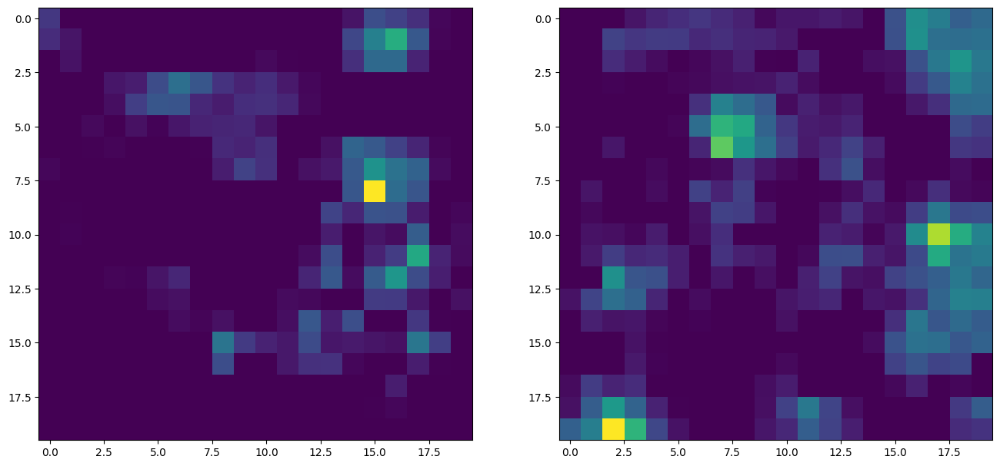

In [63]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

filters_data =[filters[0].detach().numpy() for filters in out[:2]]

fig, axes = display_img(filters_data, fig, axes)

# Generate and Plot Anchor Points

In [64]:
anc_pts_x, anc_pts_y = gen_anc_centers(out_size=(out_h, out_w))

In [65]:
# project anchor centers onto the original image
anc_pts_x_proj = anc_pts_x.clone() * width_scale_factor 
anc_pts_y_proj = anc_pts_y.clone() * height_scale_factor

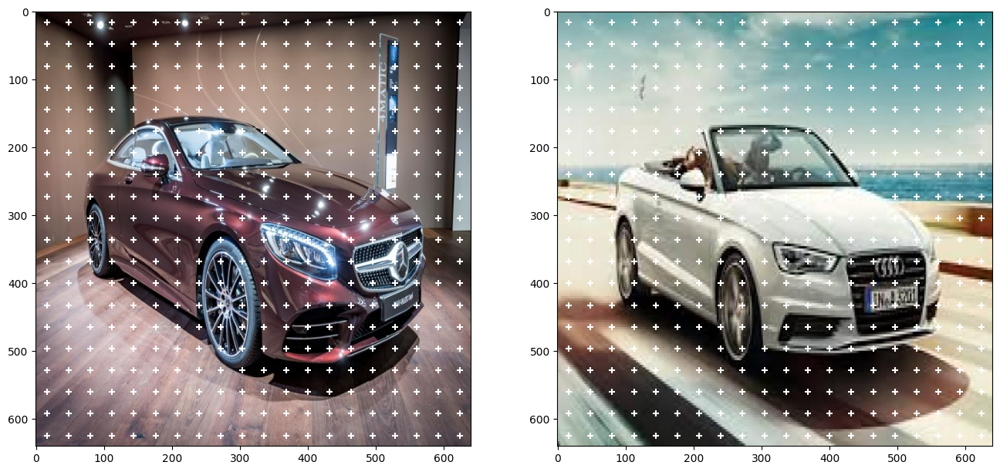

In [66]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))
 
fig, axes = display_img(img_data_all, fig, axes)
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[0])
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[1])

# Create Anchor Boxes around Anchor points

In [73]:
anc_scales = [2, 4, 6]
anc_ratios = [0.5, 1, 1.5]
n_anc_boxes = len(anc_scales) * len(anc_ratios) # number of anchor boxes for each anchor point

anc_base = gen_anc_base(anc_pts_x, anc_pts_y, anc_scales, anc_ratios, (out_h, out_w))

In [74]:
# since all the images are scaled to the same size
# we can repeat the anchor base for all the images
anc_boxes_all = anc_base.repeat(img_data_all.size(dim=0), 1, 1, 1, 1)

# plot anchor boxes on a single anchor point

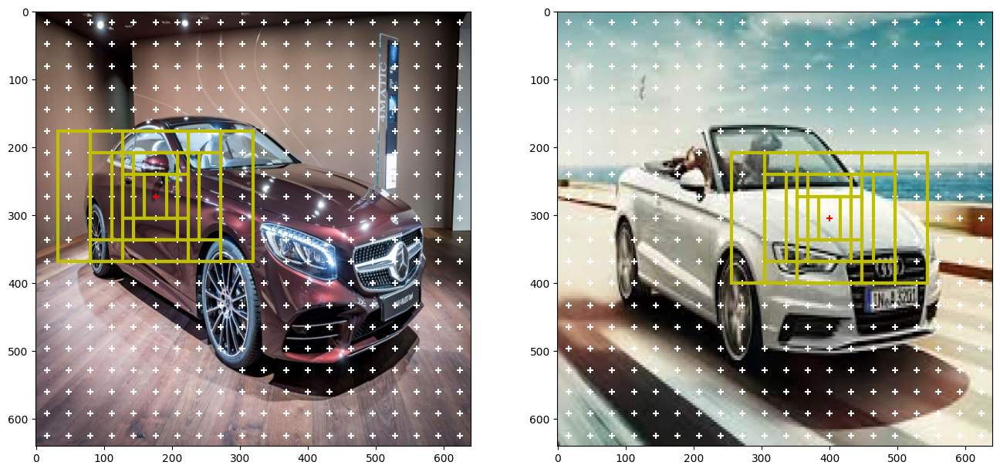

In [79]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)

# project anchor boxes to the image
anc_boxes_proj = project_bboxes(anc_boxes_all, width_scale_factor, height_scale_factor, mode='a2p')

# plot anchor boxes around selected anchor points
sp_1 = [5, 8]
sp_2 = [12, 9]
bboxes_1 = anc_boxes_proj[0][sp_1[0], sp_1[1]]
bboxes_2 = anc_boxes_proj[1][sp_2[0], sp_2[1]]

fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[0], (anc_pts_x_proj[sp_1[0]], anc_pts_y_proj[sp_1[1]]))
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[1], (anc_pts_x_proj[sp_2[0]], anc_pts_y_proj[sp_2[1]]))
fig, _ = display_bbox(bboxes_1, fig, axes[0])
fig, _ = display_bbox(bboxes_2, fig, axes[1])

# plot all anchor boxes

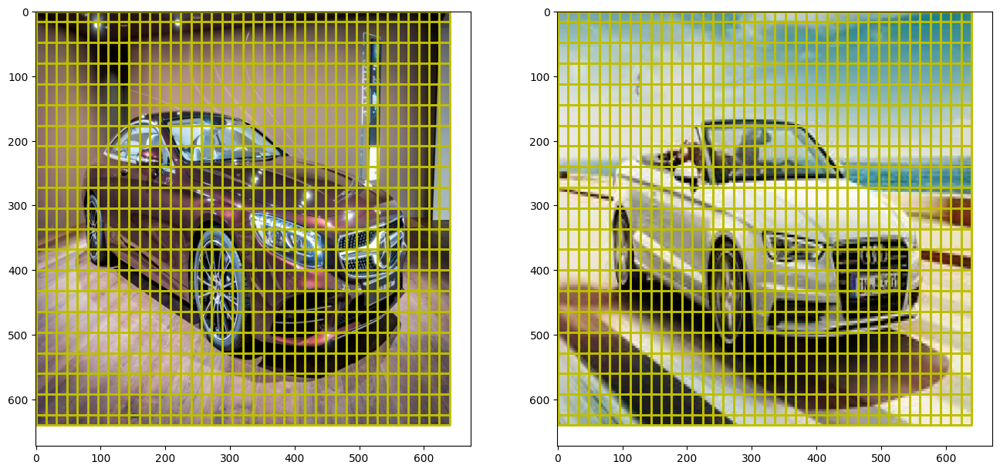

In [80]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)

# plot feature grid
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[0])
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[1])

# plot all anchor boxes
for x in range(anc_pts_x_proj.size(dim=0)):
    for y in range(anc_pts_y_proj.size(dim=0)):
        bboxes = anc_boxes_proj[0][x, y]
        fig, _ = display_bbox(bboxes, fig, axes[0], line_width=1)
        fig, _ = display_bbox(bboxes, fig, axes[1], line_width=1)

# Get Positive and Negative Anchors

In [81]:
pos_thresh = 0.7
neg_thresh = 0.3

# project gt bboxes onto the feature map
gt_bboxes_proj = project_bboxes(gt_bboxes_all, width_scale_factor, height_scale_factor, mode='p2a')
positive_anc_ind, negative_anc_ind, GT_conf_scores, \
GT_offsets, GT_class_pos, positive_anc_coords, \
negative_anc_coords, positive_anc_ind_sep = get_req_anchors(anc_boxes_all, gt_bboxes_proj, gt_classes_all, pos_thresh, neg_thresh)

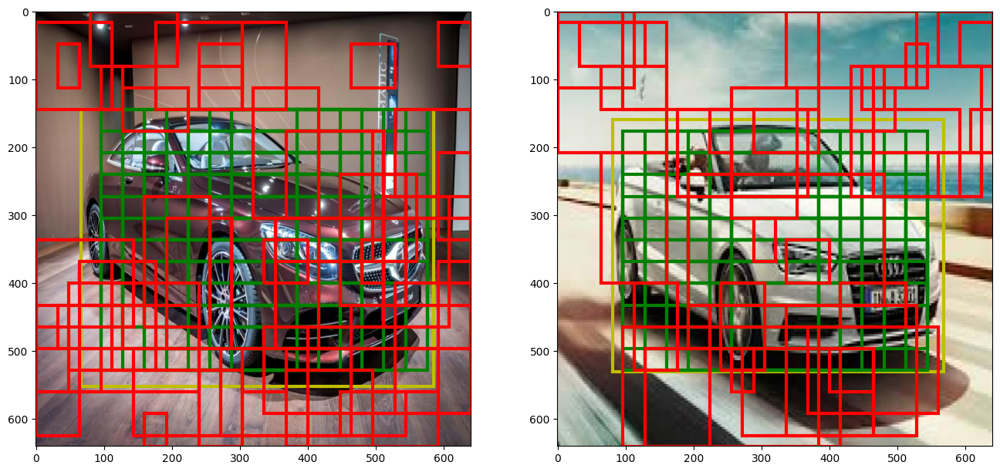

In [82]:
# project anchor coords to the image space
pos_anc_proj = project_bboxes(positive_anc_coords, width_scale_factor, height_scale_factor, mode='a2p')
neg_anc_proj = project_bboxes(negative_anc_coords, width_scale_factor, height_scale_factor, mode='a2p')

# grab +ve and -ve anchors for each image separately

anc_idx_1 = torch.where(positive_anc_ind_sep == 0)[0]
anc_idx_2 = torch.where(positive_anc_ind_sep == 1)[0]

pos_anc_1 = pos_anc_proj[anc_idx_1]
pos_anc_2 = pos_anc_proj[anc_idx_2]

neg_anc_1 = neg_anc_proj[anc_idx_1]
neg_anc_2 = neg_anc_proj[anc_idx_2]
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)

# plot groundtruth bboxes
fig, _ = display_bbox(gt_bboxes_all[0], fig, axes[0])
fig, _ = display_bbox(gt_bboxes_all[1], fig, axes[1])

# plot positive anchor boxes
fig, _ = display_bbox(pos_anc_1, fig, axes[0], color='g')
fig, _ = display_bbox(pos_anc_2, fig, axes[1], color='g')

# plot negative anchor boxes
fig, _ = display_bbox(neg_anc_1, fig, axes[0], color='r')
fig, _ = display_bbox(neg_anc_2, fig, axes[1], color='r')

# *So, we just realized the final approach, here we go with building up and tuning our model.

In [77]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [ ]:
epochs = 1
optimizer = torch.optim.SGD(model.parameters(), lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

In [79]:
def get_object_detection_model(num_classes):

    # load a model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn()
    
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor.cls_score = nn.Sequential(nn.Linear(in_features=in_features, out_features=512),
                                                            nn.ReLU(),
                                                            nn.Linear(in_features=512, out_features=64),
                                                            nn.ReLU(),
                                                            nn.Linear(in_features=64, out_features = num_classes))
    
    model.roi_heads.box_predictor.bbox_pred = nn.Linear(in_features=in_features, out_features=num_classes*4) 

    return model

In [80]:

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

num_classes = 4

model_cars = get_object_detection_model(num_classes)

model_cars.to(device)

params = [p for p in model_cars.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=2,
                                               gamma=0.1)

# Just have to realize that model correctly outputs

In [212]:
image, targets = loaders['test'].dataset[0]
print(targets)
# print(targets)
image = image.view(1, 3, 810, 640)
print(image.size())
boxes = targets['boxes']
labels = targets['labels']
dict_targets = [{'boxes': boxes, 'labels': labels}]
# dict_targets
output = model_cars(image, dict_targets)  # Returns losses and detections
print(output)

{'boxes': tensor([[ 61., 152., 759., 525.]]), 'labels': tensor([3]), 'area': tensor([260354.]), 'iscrowd': tensor([0]), 'image_id': 0}
torch.Size([1, 3, 810, 640])
{'loss_classifier': tensor(1.4535, grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0.0001, grad_fn=<DivBackward0>), 'loss_objectness': tensor(0.6944, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(0.0050, grad_fn=<DivBackward0>)}


# So, final preparings and #HereWeGo @fabriziorom

In [ ]:
# training for 5 epochs
num_epochs = 5
for epoch in range(num_epochs):
    # training for one epoch
    train_one_epoch(model_cars, optimizer, loaders['training'], device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model_cars, loaders['test'], device=device)

In [110]:
model_load = torch.load('faster_rcnn_attempt_cars_241.pt')

In [ ]:
model_load

In [ ]:
num_classes = 4
in_features = model_load.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
model_load.roi_heads.box_predictor.cls_score = nn.Sequential(nn.Linear(in_features=in_features, out_features=512),
                                                            nn.ReLU(),
                                                            nn.Linear(in_features=512, out_features=64),
                                                            nn.ReLU(),
                                                            nn.Linear(in_features=64, out_features = num_classes))

In [20]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model_load.to(device)

params = [p for p in model_load.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.05,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=2,
                                               gamma=0.1)
# print(params)

In [ ]:
# training for 5 epochs
num_epochs = 1
for epoch in range(num_epochs):
    # training for one epoch
    train_one_epoch(model_load, optimizer, loaders['training'], device, epoch, print_freq=2)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model_load, loaders['test'], device=device)

# PostTraining

In [ ]:
model = torch.save(model_load, 'faster_rcnn_attempt_cars_241_new.pt')

In [12]:
model_load_new = torch.load('faster_rcnn_attempt_cars_detection.pt')

In [ ]:
for param, x in model_load_new.named_parameters():
    if x.requires_grad:
        print(param)    

In [ ]:
model_load_new.roi_heads

In [ ]:
for param, x in model_load_new.named_parameters():
    if x.requires_grad:
        print(param)    

In [27]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model_load_new.to(device)

params = [p for p in model_load_new.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=2,
                                               gamma=0.1)


In [ ]:
# post-training for 1 epochs
num_epochs = 2
for epoch in range(num_epochs):
    # training for one epoch
    train_one_epoch(model_load_new, optimizer, loaders['training'], device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model_load_new, loaders['test'], device=device)

# Here's the final detection model shown below!

In [91]:
model = torch.save(model_load_new, 'faster_rcnn_attempt_cars_detection.pt')

In [15]:
model_load = torch.load('faster_rcnn_attempt_cars_detection.pt')

In [14]:
model = torch.save(model_load,'faster_rcnn_attempt_cars_detection.pth')

In [10]:
model_load

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# Custom Testing

In [29]:
# the function takes the original prediction and the iou threshold.

def apply_nms(orig_prediction, iou_thresh=0.3):
    
    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

# function to convert a torchtensor back to PIL image
def torch_to_pil(img):
    return transforms.ToPILImage()(img).convert('RGB')

In [30]:
def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    a.imshow(img)
    for box in (target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()

In [94]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
# pick one image from the test set
img, target = dataset_train[5]
# put the model in evaluation mode
model_load.eval()
with torch.no_grad():
    prediction = model_load([img.to(device)])[0]
    
print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

In [43]:
def predict_image(image_folder):
    image_data_all = []
    images = []
    for image in image_folder:
        image = Image.open(image)
        image = np.array(image)
        # print(image.shape)
        transform =  transforms.ToTensor()
        img_color = image
        img_color = cv2.resize(img_color, (img_width, img_height))
        
        img_color_tensor = transform(img_color)
        images.append(img_color_tensor)
        img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32)
        img_res = cv2.resize(img_gray, (img_width, img_height))
        img_res = cv2.GaussianBlur(img_res,(11, 11), 5)
        # diving by 255
        img_res /= 255.0
        transform =  transforms.ToTensor()
        img_tensor = transform(img_res)
        image_data_all.append(img_tensor)
    imgs_stacked = torch.stack(images, dim = 0)
    imgs_stacked = imgs_stacked.to(dtype=torch.float32)
    img_data_stacked = torch.stack(image_data_all, dim=0)
    img_data_stacked = img_data_stacked.to(dtype=torch.float32)

    # return img_data_stacked
    nrows, ncols = (len(image_folder), 1)
    fig, axes = plt.subplots(nrows, ncols, figsize=(50, 50))
    with torch.no_grad():
        prediction = model_load(img_data_stacked.to(device))
    # print(prediction)
    for i in range(len(image_folder)):
        # print(img_data_stacked[i].size())
        nms_prediction = apply_nms(prediction[i], iou_thresh=0.32)
        print(nms_prediction)
        bboxes_all = nms_prediction['boxes']
        class_image_pred = [idx2name[idx.item()] for idx in nms_prediction['labels']]
        # img_data_stacked = img_data_stacked.to(dtype=torch.float32)
    # nrows, ncols = (1, len(image_folder))
    # fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))
        fig, axes = display_img(imgs_stacked, fig, axes)
        fig, _ = display_bbox(bboxes_all, fig, axes[i], classes=class_image_pred)
    

In [18]:
import glob

In [44]:
image_path_custom = "C:\\Users\\Пользователь\\Desktop\\Python_Development\\German_Cars_classification\\Object_detection\\custom_test\\*.jpg"
image_folder = glob.glob(image_path_custom)[-5:]
len(image_folder)

5

{'boxes': tensor([[ 316.2839,  319.4835,  807.7540,  493.5212],
        [ 176.9887,  313.4138,  382.3500,  418.9193],
        [ 852.7133,  405.8168, 1023.9999,  626.2194]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.2784, 0.2742, 0.0737])}
{'boxes': tensor([[387.8223, 288.1000, 996.7820, 595.5013],
        [115.8034, 284.8252, 349.0305, 422.1046]]), 'labels': tensor([1, 1]), 'scores': tensor([0.2836, 0.2208])}
{'boxes': tensor([[216.8823, 421.3799, 427.5349, 527.7980],
        [345.5551, 416.6831, 959.1860, 620.2311]]), 'labels': tensor([1, 1]), 'scores': tensor([0.2732, 0.2684])}
{'boxes': tensor([[ 253.0565,  278.8312, 1010.6640,  607.2388],
        [  42.5855,  299.0752,  306.0480,  452.4133],
        [ 886.6302,  224.9720, 1023.9999,  385.2606],
        [ 622.3382,  267.7039,  863.6671,  371.3712]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.2829, 0.2815, 0.2191, 0.1684])}
{'boxes': tensor([[ 421.8166,  354.6194,  587.7199,  522.9481],
        [ 613.9791,  359.9534

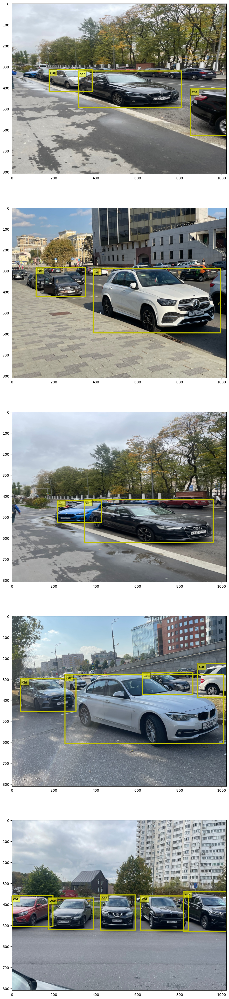

In [45]:
predict_image(image_folder)